In [ ]:
%pip install -q python-terrier


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.7/110.7 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.8/48.8 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 347.4/347.4 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 52.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 287.4/287.4 kB 22.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.6/69.6 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━

In [ ]:
import ir_datasets
dataset = ir_datasets.load("msmarco-passage/train")
for query in dataset.queries_iter():
    print(query.query_id, query.text)

[INFO] Please confirm you agree to the MSMARCO data usage agreement found at <http://www.msmarco.org/dataset.aspx>
[INFO] If you have a local copy of https://msmarco.z22.web.core.windows.net/msmarcoranking/queries.tar.gz, you can symlink it here to avoid downloading it again: /root/.ir_datasets/downloads/c177b2795d5f2dcc524cf00fcd973be1
[INFO] [starting] https://msmarco.z22.web.core.windows.net/msmarcoranking/queries.tar.gz
[INFO] [finished] https://msmarco.z22.web.core.windows.net/msmarcoranking/queries.tar.gz: [00:01] [18.9MB] [11.2MB/s]


Streaming output truncated to the last 5000 lines.
877092 what mechanisms are associated with shoulder dislocations quizlet
579503 what body system is pneumonitis found in
394808 in which year was the cane toad first introduced
172215 does the adaptil collar cause allergic reactions to me?
408439 is divergence a type of spatial summation
435722 lapsed contract definition
87726 causes of osteomyelitis
625264 what do the geography gcse exams consist of
1004288 where was william choyce born
1043203 who led the montgomery bus boycotts
391070 ideone.com price in dollars sales tax
24424 are power steering and brake fluid the same
529185 types of permanent ventriculostomy
628776 what does a didgeridoo look like
195009 gini index in brazil
923651 what were caligula accomplishments
421201 is pollen produced in pteridophytes
906363 what to do for first wedding anniversary
878579 what molecules is maltose made of
301654 how mich money does a single person need.to live confortably in arizona
92526

In [ ]:
qrel

TrecQrel(query_id='93', doc_id='11318', relevance=1, iteration='0')

In [ ]:
import random
import ir_datasets

# Load the dataset
dataset = ir_datasets.load("vaswani")

# Create a dictionary to map document IDs to their text
docs = {doc.doc_id: doc.text for doc in dataset.docs_iter()}

# Load the queries
queries = {q.query_id: q.text for q in dataset.queries_iter()}

# Prepare data in the required format
data = []

# Collect all document IDs to use for generating non-relevant pairs
all_doc_ids = list(docs.keys())
relevant_docs = set()  # To keep track of relevant doc-query pairs

# First, append the relevant pairs
for qrel in dataset.qrels_iter():
    # Fetch query text using the pre-built dictionary
    query_text = queries[qrel.query_id]

    # Fetch document text
    doc_text = docs[qrel.doc_id]

    # Fetch relevance label
    relevance_label = qrel.relevance  # 1 if relevant, 0 if not

    # Append the relevant data in the desired format
    data.append({
        "query": query_text,
        "document": doc_text,
        "label": relevance_label
    })

    # Store the relevant doc-query pair
    relevant_docs.add((qrel.query_id, qrel.doc_id))

# Now, generate non-relevant pairs
non_relevant_data = []
for query_id, query_text in queries.items():
    # Generate non-relevant pairs until the number of non-relevant samples matches the relevant ones
    while len(non_relevant_data) < len(data):
        # Randomly select a document that is not relevant to this query
        random_doc_id = random.choice(all_doc_ids)
        if (query_id, random_doc_id) not in relevant_docs:
            doc_text = docs[random_doc_id]
            non_relevant_data.append({
                "query": query_text,
                "document": doc_text,
                "label": 0  # Non-relevant label
            })

# Add non-relevant data to the main data list
data.extend(non_relevant_data)

# Shuffle the dataset to mix relevant and non-relevant samples
random.shuffle(data)

# Initialize tokenizer and model
tokenizer = AutoTokenizer.from_pretrained("gpt2")

tokenizer.pad_token = tokenizer.eos_token
tokenizer.padding_side = "right"  # Fix weird overflow issue with fp16 training

# Prepare the dataset
train_dataset = RankingDataset(data, tokenizer)

# Assuming you're fine-tuning the BackpackGPT2 model
model = AutoModelForSequenceClassification.from_pretrained("gpt2", num_labels=2)

model.config.pad_token_id = model.config.eos_token_id

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

Some weights of GPT2ForSequenceClassification were not initialized from the model checkpoint at gpt2 and are newly initialized: ['score.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


GPT2ForSequenceClassification(
  (transformer): GPT2Model(
    (wte): Embedding(50257, 768)
    (wpe): Embedding(1024, 768)
    (drop): Dropout(p=0.1, inplace=False)
    (h): ModuleList(
      (0-11): 12 x GPT2Block(
        (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): GPT2SdpaAttention(
          (c_attn): Conv1D()
          (c_proj): Conv1D()
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (mlp): GPT2MLP(
          (c_fc): Conv1D()
          (c_proj): Conv1D()
          (act): NewGELUActivation()
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
    )
    (ln_f): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (score): Linear(in_features=768, out_features=2, bias=False)
)

In [ ]:
data

[{'query': 'MEASUREMENT OF DIELECTRIC CONSTANT OF LIQUIDS BY THE USE OF MICROWAVE TECHNIQUES\n',
  'document': 'dipole resonant modes of an ionized gas column  a quasistatic treatment\nis used to show that numerous oscillation modes are possible in a\ncylindrical column of ionized gas with a rotationally symmetrical\ndistribution of electron concentration of electron concentration\nthe theory provides a qualitative explanation of the rf reflection\nof em waves observed by romell of  approximate values of the resonance\nfrequencies are calculated assuming a gaussian radial distribution\nof electron concentration some of the results may be verifiable by\nmeteor trail echo observations  an investigation is also made of\nthe finite energy loss and phase shift shown by herlofson of and others\nto occur when the real part of the dielectric constant vanishes\n',
  'label': 0},
 {'query': 'DETERMINATION OF THE CURRENT SYSTEMS IN THE UPPER ATMOSPHERE DURING MAGNETIC STORMS\n',
  'document': 'th

In [ ]:
import random
import ir_datasets

# Load the dataset
dataset = ir_datasets.load("vaswani")
# for doc in dataset.docs_iter():
#     doc #print(docs)
queries = {q.query_id: q.text for q in dataset.queries_iter()}
print(queries)
# Prepare data in the required format
data = []

# Collect all document IDs to use for generating non-relevant pairs
all_doc_ids = [doc.doc_id for doc in dataset.docs_iter()]
relevant_docs = set()  # To keep track of relevant doc-query pairs

# First, append the relevant pairs
for qrel in dataset.qrels_iter():
    # Fetch query text using the pre-built dictionary
    query_text = queries[qrel.query_id]

    # Fetch document text
  doc_text = docs.get(qrel.doc_id).text

    # Fetch relevance label
    relevance_label = qrel.relevance  # 1 if relevant, 0 if not

    # Append the relevant data in the desired format
    data.append({
        "query": query_text,
        "document": doc_text,
        "label": relevance_label
    })

    # Store the relevant doc-query pair
    relevant_docs.add((qrel.query_id, qrel.doc_id))

# Now, generate non-relevant pairs
non_relevant_data = []
for query_id, query_text in queries.items():
    # Generate non-relevant pairs until the number of non-relevant samples matches the relevant ones
    while len(non_relevant_data) < len(data) // 2:
        # Randomly select a document that is not relevant to this query
        random_doc_id = random.choice(all_doc_ids)
        if (query_id, random_doc_id) not in relevant_docs:
            doc_text = docs.get(random_doc_id).text
            non_relevant_data.append({
                "query": query_text,
                "document": doc_text,
                "label": 0  # Non-relevant label
            })

# Add non-relevant data to the main data list
data.extend(non_relevant_data)

# Shuffle the dataset to mix relevant and non-relevant samples
random.shuffle(data)


{'1': 'MEASUREMENT OF DIELECTRIC CONSTANT OF LIQUIDS BY THE USE OF MICROWAVE TECHNIQUES\n', '2': 'MATHEMATICAL ANALYSIS AND DESIGN DETAILS OF WAVEGUIDE FED MICROWAVE RADIATIONS\n', '3': 'USE OF DIGITAL COMPUTERS IN THE DESIGN OF BAND PASS FILTERS HAVING GIVEN PHASE AND ATTENUATION CHARACTERISTICS\n', '4': 'SYSTEMS OF DATA CODING FOR INFORMATION TRANSFER\n', '5': 'USE OF PROGRAMS IN ENGINEERING TESTING OF COMPUTERS\n', '6': 'NUMBER REPRESENTATION IN BINARY MACHINES\n', '7': 'SECONDARY EMISSION OF ELECTRONS BY POSITIVE ION BOMBARDMENT OF THE CATHODE\n', '8': 'MEASUREMENT OF PLASMA TEMPERATURES IN ARC DISCHARGE USING SHOCK WAVE TECHNIQUES\n', '9': 'CHARACTERISTICS OF THE SINGLE ELECTRODE DISCHARGE IN THE RARE GASES AT LOW PRESSURES\n', '10': 'METHODS OF CALCULATING INSTANTANEOUS POWER DISSIPATION IN REACTIVE CIRCUITS\n', '11': 'THE EFFECT OF OXIDATION ON CIRCUIT BREAKER CONTACTS\n', '12': 'TEMPERATURE INDEPENDENT METHODS FOR TUNING HIGHLY STABLE HIGH FREQUENCY OSCILLATORS\n', '13': 'MATHE

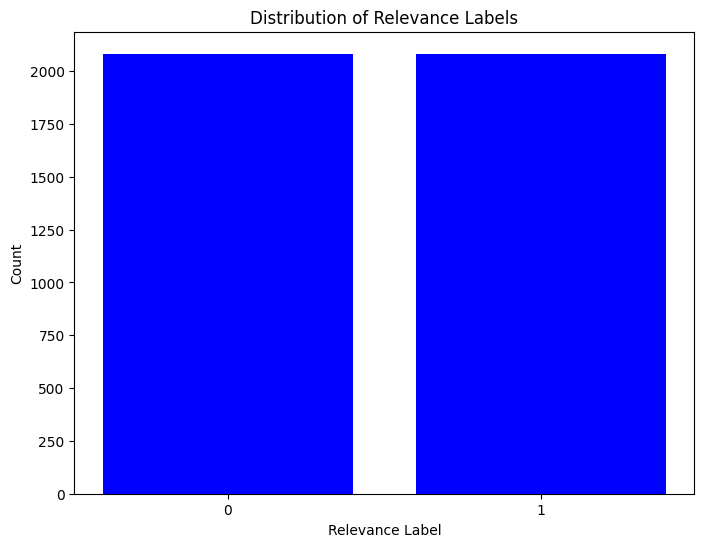

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.DataFrame(data)

# Visualize the distribution of relevance labels
label_counts = df['label'].value_counts()

# Plot the distribution
plt.figure(figsize=(8, 6))
plt.bar(label_counts.index, label_counts.values, color='blue')
plt.xlabel('Relevance Label')
plt.ylabel('Count')
plt.title('Distribution of Relevance Labels')
plt.xticks(label_counts.index)  # Ensure x-axis has correct label ticks
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

train_data, val_data = train_test_split(data, test_size=0.2, random_state=42)


In [ ]:
train_data, val_data = train_test_split(data, test_size=0.2, random_state=42)
train_dataset = RankingDataset(train_data, tokenizer)
val_dataset = RankingDataset(val_data, tokenizer)

# Initialize tokenizer and model
tokenizer = AutoTokenizer.from_pretrained("gpt2")
model = AutoModelForSequenceClassification.from_pretrained("gpt2", num_labels=2)
model.config.pad_token_id = model.config.eos_token_id

# Define training arguments
training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=3,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=10,
    evaluation_strategy="no",
)

# Initialize Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
)

# Start training
trainer.train()

# Evaluate on the validation dataset


In [ ]:
val_dataset = RankingDataset(val_data, tokenizer)


In [ ]:
pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.3/527.3 kB 17.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 16.2 MB/s eta 0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 14.0.2
    Uninstalling pyarrow-14.0.2:
      Successfully uninstalled pyarrow-14.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 17.0.0 which is incompatible.
ibis-framework 8.0.0 requires pyarrow<16,>=2, but you have pyarrow 17.0.0 which is incompatible.


In [ ]:
dataset_train = dataset['train']
dataset_train

Dataset({
    features: ['answers', 'passages', 'query', 'query_id', 'query_type', 'wellFormedAnswers'],
    num_rows: 808731
})

In [ ]:
import random

def prepare_training_data(dataset, m=36):
    train_data = []
    for example in dataset['train']:
        query = example['query']
        # Select the first document with label 1
        if isinstance(example['passages'], dict):
            is_selected_list = example['passages'].get('is_selected', [])
            passage_text_list = example['passages'].get('passage_text', [])
            if is_selected_list and passage_text_list:
                pos_indices = [i for i, val in enumerate(is_selected_list) if val == 1]
                if pos_indices:
                    pos_index = pos_indices[0]
                    pos_text = passage_text_list[pos_index]
                else:
                    continue
            else:
                continue
        else:
            continue

        # Select m-1 negative documents
        neg_indices = [i for i, val in enumerate(is_selected_list) if val == 0]
        neg_texts = [passage_text_list[i] for i in random.sample(neg_indices, min(len(neg_indices), m - 1))]
        for neg_text in neg_texts:
            train_data.append((query, pos_text, neg_text))
    return train_data

# Prepare training data
train_data = prepare_training_data(dataset)

In [ ]:
import random

def prepare_valid_data(dataset, m=36):
    train_data = []
    for example in dataset['validation']:
        query = example['query']
        # Select the first document with label 1
        if isinstance(example['passages'], dict):
            is_selected_list = example['passages'].get('is_selected', [])
            passage_text_list = example['passages'].get('passage_text', [])
            if is_selected_list and passage_text_list:
                pos_indices = [i for i, val in enumerate(is_selected_list) if val == 1]
                if pos_indices:
                    pos_index = pos_indices[0]
                    pos_text = passage_text_list[pos_index]
                else:
                    continue
            else:
                continue
        else:
            continue

        # Select m-1 negative documents
        neg_indices = [i for i, val in enumerate(is_selected_list) if val == 0]
        neg_texts = [passage_text_list[i] for i in random.sample(neg_indices, min(len(neg_indices), m - 1))]
        for neg_text in neg_texts:
            train_data.append((query, pos_text, neg_text))
    return train_data

# Prepare training data
validation_data = prepare_valid_data(dataset)

In [ ]:
import random

def prepare_test_data(dataset, m=36):
    train_data = []
    for example in dataset['test']:
        query = example['query']
        # Select the first document with label 1
        if isinstance(example['passages'], dict):
            is_selected_list = example['passages'].get('is_selected', [])
            passage_text_list = example['passages'].get('passage_text', [])
            if is_selected_list and passage_text_list:
                pos_indices = [i for i, val in enumerate(is_selected_list) if val == 1]
                if pos_indices:
                    pos_index = pos_indices[0]
                    pos_text = passage_text_list[pos_index]
                else:
                    continue
            else:
                continue
        else:
            continue

        # Select m-1 negative documents
        neg_indices = [i for i, val in enumerate(is_selected_list) if val == 0]
        neg_texts = [passage_text_list[i] for i in random.sample(neg_indices, min(len(neg_indices), m - 1))]
        for neg_text in neg_texts:
            train_data.append((query, pos_text, neg_text))
    return train_data

# Prepare training data
test_data = prepare_test_data(dataset)

In [ ]:
train_data = []
train_iter = iter(dataset['train'])
for _ in range(100):
    try:
        example = next(train_iter)
        query = example['query']
        pos_text = example['answers']
        neg_text = example['passages']
        train_data.append((query, pos_text, neg_text))
    except StopIteration:
        break

In [14]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.3/527.3 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 12.2 MB/s eta 0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 14.0.2
    Uninstalling pyarrow-14.0.2:
      Successfully uninstalled pyarrow-14.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 17.0.0 which is incompatible.
ibis-framework 8.0.0 requires pyarrow<16,>=2, but you have pyarrow 17.0.0 which is incompatible.


In [15]:
from datasets import load_dataset

ds = load_dataset("google-research-datasets/natural_questions", "dev")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Resolving data files:   0%|          | 0/287 [00:00<?, ?it/s]

Generating validation split:   0%|          | 0/7830 [00:00<?, ? examples/s]

In [16]:
ds

DatasetDict({
    validation: Dataset({
        features: ['id', 'document', 'question', 'long_answer_candidates', 'annotations'],
        num_rows: 7830
    })
})

In [20]:
ds['validation']

Dataset({
    features: ['id', 'document', 'question', 'long_answer_candidates', 'annotations'],
    num_rows: 7830
})

In [ ]:
combined_texts = []

for example in ds['validation']:
    # Extract the text field from the question dictionary
    question_text = example['question'].get('text', '')

    # Extract the annotation from the example
    annotation_answer = example['annotations']
    print(annotation_answer)
    # Initialize a list to store all the answer texts
    answer_texts = []

    # Extract the long answer text if it exists
    long_answer = annotation_answer.get('long_answer', [{}])[0]
    print(long_answer)
    if long_answer.get('start_token', -1) != -1:
        # Assuming you have the original text and tokens, you can extract the text using the start and end tokens
        # For this example, we'll use the 'text' field if available in short_answers
        if annotation_answer.get('short_answers', [{}])[0].get('text'):
            long_answer_text = ' '.join(annotation_answer['short_answers'][0]['text'])
            answer_texts.append(long_answer_text)

    # Extract the short answer texts if they exist
    short_answers = annotation_answer.get('short_answers', [])
    for short_answer in short_answers:
        if short_answer.get('text'):
            short_answer_texts = ' '.join(short_answer['text'])
            answer_texts.append(short_answer_texts)

    # Combine all answer texts into a single string
    combined_answer_text = ' '.join(answer_texts)

    # Add the combined answer text to the question text
    combined_text = f"{question_text} {combined_answer_text}".strip()

    # Add the combined text to the list
    combined_texts.append(combined_text)

# Print the combined texts
for text in combined_texts:
    print(text)

Streaming output truncated to the last 5000 lines.
{'id': ['7446754008545516024', '12642245928063727450', '363144947498550909', '14665719605603556666', '18385007722218210524'], 'long_answer': [{'start_token': -1, 'end_token': -1, 'start_byte': -1, 'end_byte': -1, 'candidate_index': -1}, {'start_token': -1, 'end_token': -1, 'start_byte': -1, 'end_byte': -1, 'candidate_index': -1}, {'start_token': -1, 'end_token': -1, 'start_byte': -1, 'end_byte': -1, 'candidate_index': -1}, {'start_token': -1, 'end_token': -1, 'start_byte': -1, 'end_byte': -1, 'candidate_index': -1}, {'start_token': -1, 'end_token': -1, 'start_byte': -1, 'end_byte': -1, 'candidate_index': -1}], 'short_answers': [{'start_token': [], 'end_token': [], 'start_byte': [], 'end_byte': [], 'text': []}, {'start_token': [], 'end_token': [], 'start_byte': [], 'end_byte': [], 'text': []}, {'start_token': [], 'end_token': [], 'start_byte': [], 'end_byte': [], 'text': []}, {'start_token': [], 'end_token': [], 'start_byte': [], 'end_b

In [30]:
annotation_answer

{}

In [ ]:
df_val = []
for example in ds['validation']:
    # Extract the text field from the question dictionary
    question_text = example['question'].get('text', '')
    document_text = example['document'].get('html','')
    annotation_answer = example['annotations']


    # Print the question text
    print(annotation_answer)

Streaming output truncated to the last 5000 lines.
{'id': ['1864781185228661534', '13469174289633652711', '18182906842659362993', '2314151262734873468', '16505880190254022370'], 'long_answer': [{'start_token': 195, 'end_token': 285, 'start_byte': 57675, 'end_byte': 58301, 'candidate_index': 8}, {'start_token': 195, 'end_token': 285, 'start_byte': 57675, 'end_byte': 58301, 'candidate_index': 8}, {'start_token': 195, 'end_token': 285, 'start_byte': 57675, 'end_byte': 58301, 'candidate_index': 8}, {'start_token': 195, 'end_token': 285, 'start_byte': 57675, 'end_byte': 58301, 'candidate_index': 8}, {'start_token': 195, 'end_token': 285, 'start_byte': 57675, 'end_byte': 58301, 'candidate_index': 8}], 'short_answers': [{'start_token': [], 'end_token': [], 'start_byte': [], 'end_byte': [], 'text': []}, {'start_token': [], 'end_token': [], 'start_byte': [], 'end_byte': [], 'text': []}, {'start_token': [], 'end_token': [], 'start_byte': [], 'end_byte': [], 'text': []}, {'start_token': [], 'end_

In [ ]:
import os
import json
import gzip
from transformers import AutoTokenizer, AutoModelForSequenceClassification, TrainingArguments, Trainer
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset
import torch
from datasets import load_dataset

# Load the MS MARCO dataset from Hugging Face
dataset= load_dataset("microsoft/ms_marco", "v2.1")

class RankingDataset(Dataset):
    def __init__(self, data, tokenizer):
        self.data = data
        self.tokenizer = tokenizer

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        query, pos_text, neg_text = self.data[idx]
        encoding = self.tokenizer(query, pos_text, neg_text, padding='max_length', truncation=True, return_tensors='pt')
        return {
            'input_ids': encoding['input_ids'],
            'attention_mask': encoding['attention_mask'],
            'labels': torch.tensor([1, 0])  # Positive label for positive text, negative label for negative text
        }

# Initialize tokenizer and model
tokenizer = AutoTokenizer.from_pretrained("gpt2")
model = AutoModelForSequenceClassification.from_pretrained("gpt2", num_labels=2)
model.config.pad_token_id = model.config.eos_token_id

# Create datasets
train_dataset = RankingDataset(train_data, tokenizer)
val_dataset = RankingDataset(val_data, tokenizer)

# Define training arguments
training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=3,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=10,
    evaluation_strategy="steps",
    eval_steps=100,  # Evaluate every 100 steps
)

# Initialize Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
)

# Start training
trainer.train()

# Evaluate on the validation dataset
eval_results = trainer.evaluate()
print(eval_results)

Generating validation split:   0%|          | 0/101093 [00:00<?, ? examples/s]

Generating train split:   0%|          | 0/808731 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/101092 [00:00<?, ? examples/s]

KeyError: 'positive_passage'

In [ ]:
train_data, val_data = train_test_split(data, test_size=0.2, random_state=42)
train_dataset = RankingDataset(train_data, tokenizer)
val_dataset = RankingDataset(val_data, tokenizer)
val_data

[{'query': 'MEASUREMENT OF DIELECTRIC CONSTANT OF LIQUIDS BY THE USE OF MICROWAVE TECHNIQUES\n',
  'document': 'an electrolytic tank as an analogue computing machine for factorizing\nhigh degree polynomials  by means of simple measurements all the\nroots of a polynomial as high as the degree can be located to within\nabout\n',
  'label': 0},
 {'query': 'MEASUREMENT OF DIELECTRIC CONSTANT OF LIQUIDS BY THE USE OF MICROWAVE TECHNIQUES\n',
  'document': 'visual thresholds for detecting an earth satellite\n',
  'label': 0},
 {'query': 'MEASUREMENT OF DIELECTRIC CONSTANT OF LIQUIDS BY THE USE OF MICROWAVE TECHNIQUES\n',
  'document': 'some sparkover phenomena with enclosed gaps  breakdown characteristics\nof an unventilated and nonirradiated uniform gap are examined and\ncompared with those obtained uneer a variety of conditions of venti\nation\n',
  'label': 0},
 {'query': 'MEASUREMENT OF DIELECTRIC CONSTANT OF LIQUIDS BY THE USE OF MICROWAVE TECHNIQUES\n',
  'document': 'the wien bridge a

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
#from pyterrier.measures import ndcg_cut, rr, precision
from sklearn.metrics import confusion_matrix, accuracy_score
import pandas as pd
def precision_at_k(true_labels, predictions, k=10):
    df = pd.DataFrame({"true": true_labels, "pred": predictions})
    df_sorted = df.sort_values(by="pred", ascending=False).head(k)
    return np.mean(df_sorted["true"])

def ndcg_at_k(true_labels, predictions, k=10):
    df = pd.DataFrame({"true": true_labels, "pred": predictions})
    df_sorted = df.sort_values(by="pred", ascending=False)
    dcg = np.sum((2**df_sorted["true"] - 1) / np.log2(np.arange(len(df_sorted)) + 2))
    idcg = np.sum((2**np.sort(true_labels)[::-1] - 1) / np.log2(np.arange(len(true_labels)) + 2))
    return dcg / idcg if idcg > 0 else 0

def reciprocal_rank(true_labels, predictions):
    sorted_df = pd.DataFrame({"true": true_labels, "pred": predictions}).sort_values(by="pred", ascending=False)
    for idx, row in sorted_df.iterrows():
        if row["true"] == 1:
            return 1 / (idx + 1)
    return 0

# Evaluate on the validation dataset
eval_results = trainer.predict(val_dataset)
predictions = np.argmax(eval_results.predictions, axis=1)
labels = eval_results.label_ids

# Compute metrics
accuracy = accuracy_score(labels, predictions)
cm = confusion_matrix(labels, predictions)
map_score = precision_at_k(labels, predictions)
rr_score = reciprocal_rank(labels, predictions)
p10_score = precision_at_k(labels, predictions, k=10)
ndcg10_score = ndcg_at_k(labels, predictions, k=10)

# Print metrics
print("Accuracy:", accuracy)
print("Confusion Matrix:\n", cm)
print("Mean Average Precision (MAP):", map_score)
print("Reciprocal Rank (RR):", rr_score)
print("Precision at 10 (P@10):", p10_score)
print("Normalized Discounted Cumulative Gain at 10 (NDCG@10):", ndcg10_score)

Accuracy: 0.9916067146282974
Confusion Matrix:
 [[421   0]
 [  7 406]]
Mean Average Precision (MAP): 1.0
Reciprocal Rank (RR): 0.04
Precision at 10 (P@10): 1.0
Normalized Discounted Cumulative Gain at 10 (NDCG@10): 0.9990985678315456


In [ ]:
val_dataset

[('What is AI?',
  'Artificial Intelligence is a branch of computer science...',
  1),
 ('How does a computer work?', 'A computer works by executing programs...', 0),
 ('What is machine learning?', 'Machine learning is a subset of AI...', 1),
 ('How to bake a cake?', 'Baking a cake involves mixing ingredients...', 0),
 ('What is deep learning?',
  'Deep learning is a technique in machine learning...',
  1),
 ('How to fix a leaky faucet?', 'Fixing a leaky faucet requires tools...', 0),
 ('What is natural language processing?',
  'NLP is the interaction between computers and humans...',
  1),
 ('How to grow tomatoes?',
  'Growing tomatoes requires soil and sunlight...',
  0),
 ('What is computer vision?', 'Computer vision enables machines to see...', 1),
 ('How to train a dog?',
  'Training a dog involves patience and consistency...',
  0)]

In [ ]:
trainer.save_model('/content/drive/MyDrive/Colab Notebooks/DS_P/MIR_Model/gpt2_ranking')


In [ ]:
# eval_results = trainer.predict(val_dataset)
# predictions = np.argmax(eval_results.predictions, axis=1)
# labels = eval_results.label_ids

# # Compute metrics
# accuracy = accuracy_score(labels, predictions)
# cm = confusion_matrix(labels, predictions)
# map_score = precision_at_k(labels, predictions)
# rr_score = reciprocal_rank(labels, predictions)
# p10_score = precision_at_k(labels, predictions, k=10)
# ndcg10_score = ndcg_at_k(labels, predictions, k=10)

# # Print metrics
# print("Accuracy:", accuracy)
# print("Confusion Matrix:\n", cm)
# print("Mean Average Precision (MAP):", map_score)
# print("Reciprocal Rank (RR):", rr_score)
# print("Precision at 10 (P@10):", p10_score)
# print("Normalized Discounted Cumulative Gain at 10 (NDCG@10):", ndcg10_score)

TypeError: vars() argument must have __dict__ attribute

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

# Saving the model after training

# Example of inference
def predict_relevance(query, document):
    model.eval()
    input_text = f"give me the"
    encoding = tokenizer.encode_plus(
        input_text,
        add_special_tokens=True,
        max_length=512,
        padding='max_length',
        truncation=True,
        return_tensors="pt"
    )
    input_ids = encoding['input_ids'].to(device)
    attention_mask = encoding['attention_mask'].to(device)

    with torch.no_grad():
        outputs = model(input_ids=input_ids, attention_mask=attention_mask)
        logits = outputs.logits
        predicted_label = torch.argmax(logits, dim=-1).item()

    return "true" if predicted_label == 1 else "false"


In [ ]:
query = "what is the  about World War 2?"
document = "this is not about ."
print(f"Query: {query} , Document: {document} , Relevant: {predict_relevance(query, document)}")